## Limpeza e Organização dos dados

In [1]:
import pandas as pd

dados = pd.read_csv("CCGENERAL.csv")

dados.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


### Informações gerais

In [2]:
# Dados gerais e métricas sobre os dados
dados.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


#### Variáveis Correlacionadas

<AxesSubplot:>

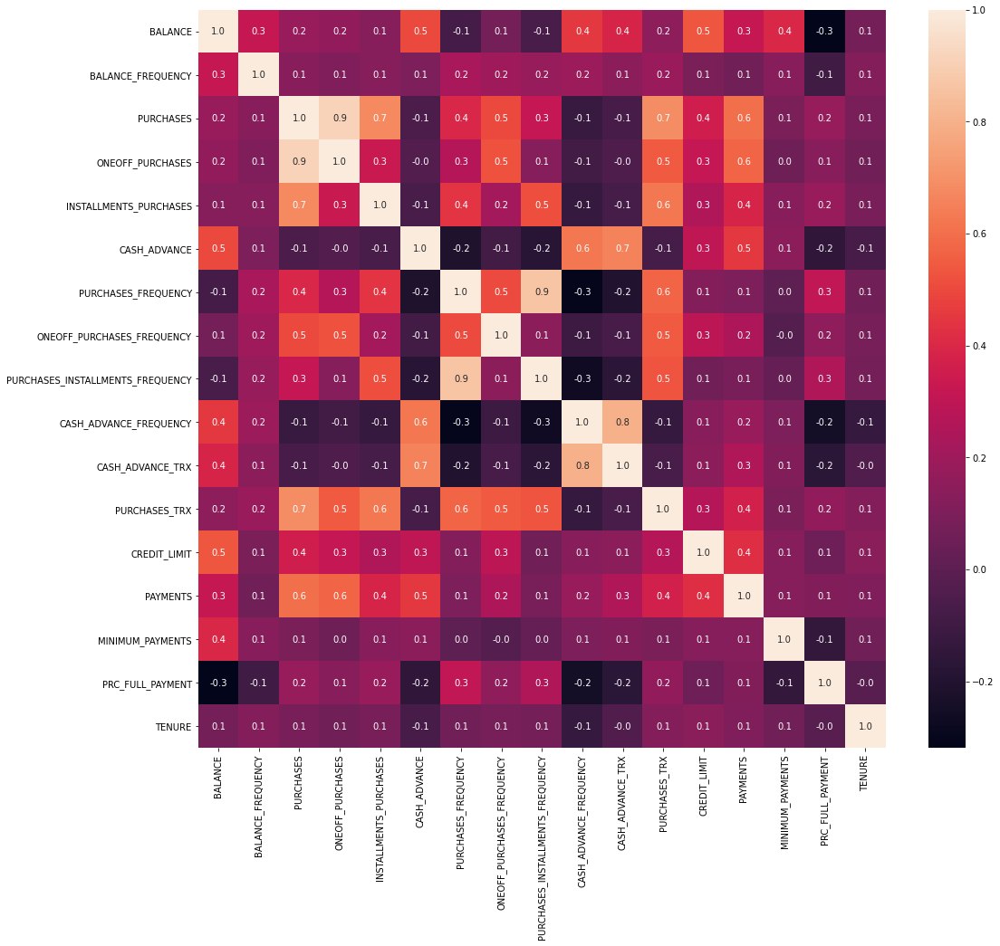

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

matriz_correlacao = dados.corr()

# Exibição do mapa de calor da variáveis correlacionadas
plt.figure(figsize=(17,15))
sns.heatmap(matriz_correlacao, annot=True, fmt='.1f')

In [4]:
# Uso de medida de 0.8 para definir a correlação
matriz_correlacao_v1 = matriz_correlacao[matriz_correlacao>0.8]

# Soma para encontrar os valores selecionados anteriormente
matriz_correlacao_v2 = matriz_correlacao_v1.sum()

# Definição de quais são as variáveis correlacionadas
variaveis_correlacionadas = matriz_correlacao_v2[matriz_correlacao_v2>1]

variaveis_correlacionadas

PURCHASES                           1.916845
ONEOFF_PURCHASES                    1.916845
PURCHASES_FREQUENCY                 1.862934
PURCHASES_INSTALLMENTS_FREQUENCY    1.862934
dtype: float64

### Organização dos dados para o Clustering

#### Remoção de dados irrelevantes

In [5]:
# Dados com a remoção das duas colunas não tão relevantes
dados_v1 = dados.drop(columns=['CUST_ID', 'TENURE'])

dados_v1.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000


#### Busca por atributos NULL

In [6]:
# Retorna quantos valores estão faltando em cada uma das colunas
missing = dados_v1.isna().sum()

missing

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
dtype: int64

In [7]:
# Preenchimento dos dados faltantes com a média da coluna respectiva
dados_v2 = dados_v1.fillna(dados_v1.median())

missing = dados_v2.isna().sum()

missing

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
dtype: int64

### Normalização dos valores para o Clustering

In [8]:
from sklearn.preprocessing import Normalizer

# Normalização dos valores para melhorar a clusterização
values = Normalizer().fit_transform(dados_v2)

values

array([[3.93555441e-02, 7.87271593e-04, 9.17958473e-02, ...,
        1.94178127e-01, 1.34239194e-01, 0.00000000e+00],
       [2.93875903e-01, 8.34231560e-05, 0.00000000e+00, ...,
        3.76516684e-01, 9.84037959e-02, 2.03923046e-05],
       [3.10798149e-01, 1.24560965e-04, 9.63068011e-02, ...,
        7.74852335e-02, 7.81351982e-02, 0.00000000e+00],
       ...,
       [2.27733092e-02, 8.11060955e-04, 1.40540698e-01, ...,
        7.90986945e-02, 8.02156174e-02, 2.43318384e-04],
       [2.65257948e-02, 1.64255731e-03, 0.00000000e+00, ...,
        1.03579625e-01, 1.09898221e-01, 4.92767391e-04],
       [1.86406219e-01, 3.33426837e-04, 5.46778061e-01, ...,
        3.15915455e-02, 4.41568390e-02, 0.00000000e+00]])

In [9]:
# Transformando os valores de volta em um DataFrame
dados_v3 = pd.DataFrame(values, columns=dados_v2.columns)

dados_v3

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
0,0.039356,0.000787,0.091796,0.000000,0.091796,0.000000,0.000160,0.000000,0.000080,0.000000,0.000000,0.001924,0.962221,0.194178,0.134239,0.000000
1,0.293876,0.000083,0.000000,0.000000,0.000000,0.591240,0.000000,0.000000,0.000000,0.000023,0.000367,0.000000,0.642358,0.376517,0.098404,0.000020
2,0.310798,0.000125,0.096307,0.096307,0.000000,0.000000,0.000125,0.000125,0.000000,0.000000,0.000000,0.001495,0.934207,0.077485,0.078135,0.000000
3,0.208887,0.000080,0.187872,0.187872,0.000000,0.025792,0.000010,0.000010,0.000000,0.000010,0.000125,0.000125,0.939988,0.000000,0.039147,0.000000
4,0.504298,0.000617,0.009867,0.009867,0.000000,0.000000,0.000051,0.000051,0.000000,0.000000,0.000000,0.000617,0.740060,0.418340,0.150967,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,0.025197,0.000884,0.257441,0.000000,0.257441,0.000000,0.000884,0.000000,0.000737,0.000000,0.000000,0.005306,0.884314,0.287928,0.043231,0.000442
8946,0.016485,0.000859,0.257811,0.000000,0.257811,0.000000,0.000859,0.000000,0.000716,0.000000,0.000000,0.005156,0.859370,0.237067,0.268419,0.000000
8947,0.022773,0.000811,0.140541,0.000000,0.140541,0.000000,0.000811,0.000000,0.000649,0.000000,0.000000,0.004866,0.973274,0.079099,0.080216,0.000243
8948,0.026526,0.001643,0.000000,0.000000,0.000000,0.072060,0.000000,0.000000,0.000000,0.000329,0.003942,0.000000,0.985535,0.103580,0.109898,0.000493


## Clusterização

### Uso da Técnica K-Means para fazer o cluster

In [10]:
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score

#### Cálculo do Coeficiente de Silhueta do K-Means

In [11]:
faixa_n_clusters = [i for i in range(2,10)]
valores_silhueta = []

for k in faixa_n_clusters:
    agrupador = KMeans(n_clusters=k)
    labels = agrupador.fit_predict(dados_v3)
    media_silhueta = silhouette_score(dados_v3, labels)
    valores_silhueta.append(media_silhueta)    

In [12]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=faixa_n_clusters, y=valores_silhueta))

fig.update_layout(title='Valores de Silhueta Médios',
                  xaxis_title='Número de Clústeres', 
                  yaxis_title='Valor Médio de Silhueta')

fig.show()

In [13]:
# n_init => tem que retornar o mesmo valor X vezes para ser valido
# max_iter => número max de interações feitas
kmeans = KMeans(n_clusters=6, n_init=10, max_iter=300)

y_pred = kmeans.fit_predict(values)

labels = kmeans.labels_

#### Cálculo da métrica de Davies-Bouldin

In [14]:
davies_bouldin = davies_bouldin_score(dados_v3, labels)

# Quanto mais perto de 0 melhor
davies_bouldin

1.045004007097831

#### Cálculo da métrica de Calinski Harabasz

In [15]:
calinski_harabasz = calinski_harabasz_score(dados_v3, labels)

calinski_harabasz

3523.5097340783173

In [35]:
figure = go.Figure()

# Método para gerar o gráfico em 3D
figure.add_trace(go.Scatter3d(x=dados_v3['BALANCE'], 
                              y=dados_v3['CREDIT_LIMIT'], 
                              z=dados_v3['PURCHASES'], 
                              mode='markers', 
                              marker=dict(color=kmeans.labels_.astype(np.float)),
                              text=kmeans.labels_))

figure.show()

In [17]:
centros = pd.DataFrame(kmeans.cluster_centers_)
centros.columns = dados_v3.columns

centros

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
0,0.561583,0.000300,0.083268,0.047038,0.036268,0.104987,0.000087,0.000033,0.000060,0.000043,0.000754,0.001842,0.720681,0.191629,0.210628,1.158880e-07
1,0.154600,0.000244,0.443775,0.260489,0.183464,0.026255,0.000205,0.000090,0.000151,0.000009,0.000174,0.006189,0.603086,0.400606,0.083947,7.313296e-05
2,0.065199,0.000232,0.122147,0.047915,0.074334,0.019766,0.000175,0.000034,0.000142,0.000007,0.000115,0.002891,0.945402,0.154862,0.055784,7.793945e-05
3,0.371231,0.000231,0.041355,0.024013,0.017347,0.501341,0.000048,0.000016,0.000031,0.000081,0.001819,0.000803,0.707727,0.151104,0.131465,2.407840e-06
4,0.297208,0.000244,0.149291,0.027951,0.121756,0.060518,0.000151,0.000018,0.000139,0.000019,0.000432,0.003620,0.341176,0.238003,0.726778,4.462432e-06
5,0.228967,0.000210,0.068590,0.038850,0.029745,0.366446,0.000058,0.000023,0.000039,0.000059,0.001417,0.001301,0.522134,0.633437,0.105744,3.102901e-05


In [18]:
figure = go.Figure()

# Método para gerar o gráfico em 3D
figure.add_trace(go.Scatter3d(x=centros['BALANCE'], 
                              y=centros['CREDIT_LIMIT'], 
                              z=centros['PURCHASES'], 
                              mode='markers', 
                              marker=dict(color='red'),
                              text=[0, 1, 2, 3, 4, 5]))

figure.show()

### Validação dos Cluesters

#### Função para calcular as métricas com base no número de clusters

In [19]:
def clustering_algorithm(n_clusters, dataset):
    kmeans = KMeans(n_clusters=n_clusters, n_init=10, max_iter=300)
    labels = kmeans.fit_predict(dataset)
    
    s = silhouette_score(dataset, labels)
    d = davies_bouldin_score(dataset, labels)
    c = calinski_harabasz_score(dataset, labels)
    
    return s, d, c

##### Com 3 clusters

In [20]:
s3,d3,c3 = clustering_algorithm(3, dados_v3)

print(s3,d3,c3)

0.3272441297573543 1.308440122716424 3526.4424114398494


##### Com 5 clusters

In [21]:
s5,d5,c5 = clustering_algorithm(5, dados_v3)

print(s5,d5,c5)

0.36454259456819194 1.0761660873408905 3431.7942247078017


##### Com 10 clusters

In [22]:
s10,d10,c10 = clustering_algorithm(10, dados_v3)

print(s10,d10,c10)

0.3514876464552694 1.1146202857787446 3019.148688450803


### Estabilidade do Clusters

In [23]:
# Divisão do nosso cluster em 3 partes
set1, set2, set3 = np.array_split(dados_v3, 3)

# Geração das métricas para as 3 partes geradas
s1, d1, c1 = clustering_algorithm(6, set1)
s2, d2, c2 = clustering_algorithm(6, set2)
s3, d3, c3 = clustering_algorithm(6, set3)

# Análise de quão similares elas foram
print("Set1 :", s1, d1, c1)
print("Set2 :", s2, d2, c2)
print("Set3 :", s3, d3, c3)

Set1 : 0.36440907376150267 1.0224064475035266 1192.377089352038
Set2 : 0.36434845177962466 1.0628016474619313 1169.4239050367103
Set3 : 0.37214104683663085 1.0421284102742254 1184.7906595394315


### Vizualização dos Cluesters

Text(0, 0.5, 'Valor total gasto')

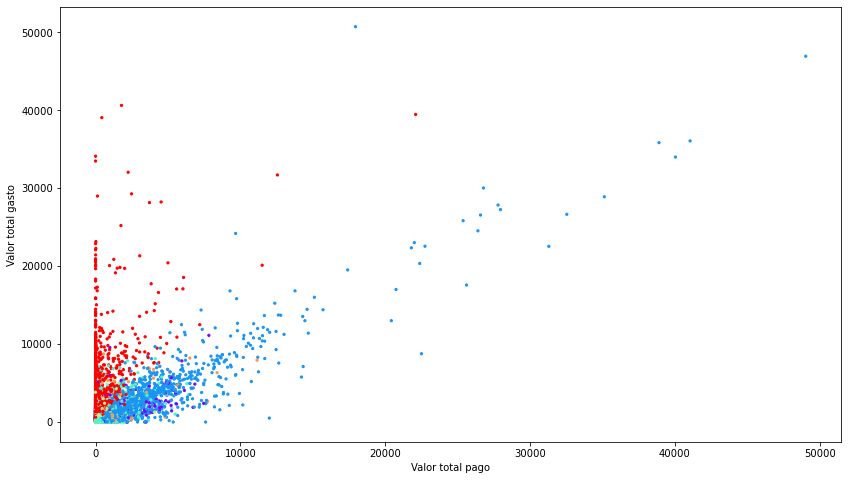

In [24]:
plt.figure(figsize=(14,8))
plt.scatter(dados_v2['PURCHASES'], dados_v2['PAYMENTS'], c=labels, s=5, cmap="rainbow")
plt.xlabel("Valor total pago")
plt.ylabel("Valor total gasto")

In [25]:
dados_v4 = dados_v2

# Necessário para o Seaborn mostrar de par em par
dados_v4['cluster'] = labels 

dados_v4.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,cluster
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,2
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,3
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,2
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,2
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,0


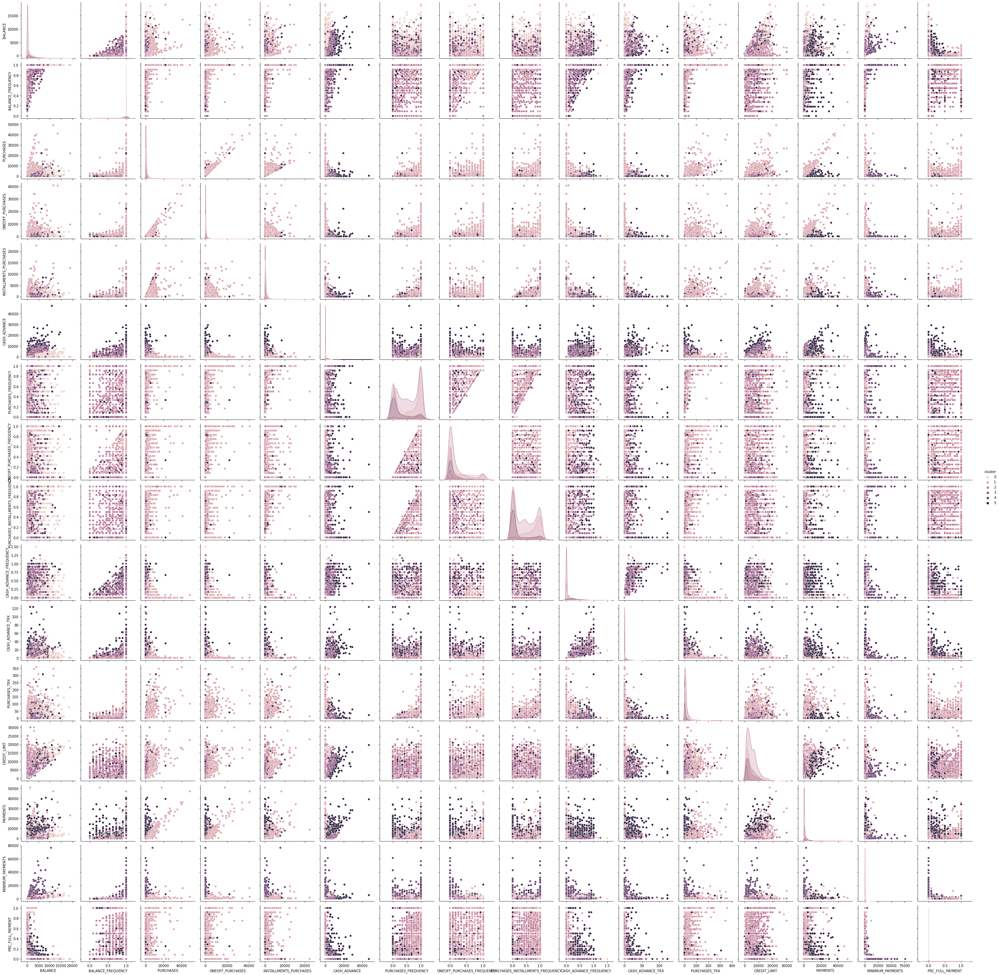

In [26]:
sns.pairplot(dados_v4[0:], hue="cluster")

In [27]:
dados_v4.groupby("cluster").describe()

BALANCE                                                     \
          count         mean          std         min          25%   
cluster                                                              
0        1797.0  3244.295629  2631.349249  114.523682  1355.437063   
1        1487.0  1118.416028  1648.962974    0.000000   208.867069   
2        3205.0   417.940367   797.134616    0.000000    22.879526   
3        1143.0  2429.889170  2032.506183    1.691842   945.019242   
4         342.0  1959.062058  1816.549846   70.794108  1010.501276   
5         976.0  1764.451238  1997.702663    0.000000   498.517960   

                                                BALANCE_FREQUENCY            \
                 50%          75%           max             count      mean   
cluster                                                                       
0        2270.227330  4496.709257  18495.558550            1797.0  0.998536   
1         541.240795  1357.885440  19043.138560            1487.0  0.929561   
2          79.432369   380.384776   7533.854422            3205.0  0.774363   
3        1845.210833  3327.567339  11581.933500            1143.0  0.892026   
4        1301.788287  2150.506924  11209.370760             342.0  0.987365   
5        1064.673318  2266.235261  14581.459140             976.0  0.856402   

         ... MINIMUM_PAYMENTS               PRC_FULL_PAYMENT            \
         ...              75%           max            count      mean   
cluster  ...                                                             
0        ...      1474.409318   9642.502512           1797.0  0.000097   
1        ...       500.419877  18621.013310           1487.0  0.284099   
2        ...       238.811356   3933.230932           3205.0  0.252514   
3        ...      1026.936888   8644.138069           1143.0  0.008869   
4        ...      8172.035927  76406.207520            342.0  0.022729   
5        ...       890.006121  21235.065300            976.0  0.128996   

                                                           
              std  min  25%       50%       75%       max  
cluster                                                    
0        0.002908  0.0  0.0  0.000000  0.000000  0.090909  
1        0.369403  0.0  0.0  0.083333  0.571429  1.000000  
2        0.348758  0.0  0.0  0.000000  0.454545  1.000000  
3        0.044389  0.0  0.0  0.000000  0.000000  0.600000  
4        0.099126  0.0  0.0  0.000000  0.000000  1.000000  
5        0.197731  0.0  0.0  0.083333  0.166667  1.000000  

[6 rows x 128 columns]

### Selecionando atributos

In [28]:
# Calcular a variância entre cada um dos atributos para selecionar os mais diferentes
centroids = kmeans.cluster_centers_

centroids

array([[5.61582959e-01, 3.00402035e-04, 8.32683226e-02, 4.70383031e-02,
        3.62678493e-02, 1.04987160e-01, 8.69238686e-05, 3.31513131e-05,
        6.01906385e-05, 4.30949122e-05, 7.54056812e-04, 1.84185868e-03,
        7.20680652e-01, 1.91628558e-01, 2.10628353e-01, 1.15887991e-07],
       [1.54599773e-01, 2.44425945e-04, 4.43775262e-01, 2.60489090e-01,
        1.83463680e-01, 2.62547411e-02, 2.04881464e-04, 8.97966293e-05,
        1.50826491e-04, 9.46179230e-06, 1.73760012e-04, 6.18914156e-03,
        6.03086417e-01, 4.00606243e-01, 8.39467783e-02, 7.31329629e-05],
       [6.51990576e-02, 2.31513752e-04, 1.22146601e-01, 4.79152249e-02,
        7.43339500e-02, 1.97660075e-02, 1.74899362e-04, 3.38244281e-05,
        1.41994550e-04, 7.36391140e-06, 1.15288439e-04, 2.89149230e-03,
        9.45401598e-01, 1.54861696e-01, 5.57842542e-02, 7.79394483e-05],
       [3.71230777e-01, 2.30637496e-04, 4.13552925e-02, 2.40132591e-02,
        1.73467336e-02, 5.01340843e-01, 4.76712104e-05, 1.623

In [29]:
import statistics

# jeito que tirei da cabeça
"""variancia_atributos = []

for i in range (0, len(centroids[0])):
    valores = centroids[:,i]
    variancia = statistics.variance(valores)
    variancia_atributos.append(variancia)

variancia_atributos"""

for i in range(len(centroids[0])):
    print(dados_v3.columns.values[i], ": {:.4f}".format(centroids[:,i].var()))

BALANCE : 0.0254
BALANCE_FREQUENCY : 0.0000
PURCHASES : 0.0183
ONEOFF_PURCHASES : 0.0070
INSTALLMENTS_PURCHASES : 0.0035
CASH_ADVANCE : 0.0345
PURCHASES_FREQUENCY : 0.0000
ONEOFF_PURCHASES_FREQUENCY : 0.0000
PURCHASES_INSTALLMENTS_FREQUENCY : 0.0000
CASH_ADVANCE_FREQUENCY : 0.0000
CASH_ADVANCE_TRX : 0.0000
PURCHASES_TRX : 0.0000
CREDIT_LIMIT : 0.0348
PAYMENTS : 0.0300
MINIMUM_PAYMENTS : 0.0539
PRC_FULL_PAYMENT : 0.0000


In [30]:
import operator

dic = {}

for i in range(len(centroids[0])):
    dic[dados_v3.columns.values[i]] = (centroids[:,i].var())
    
sorted_dic = sorted(dic.items(), key=operator.itemgetter(1))

sorted_dic

[('ONEOFF_PURCHASES_FREQUENCY', 6.348956130618443e-10),
 ('CASH_ADVANCE_FREQUENCY', 7.279230995585432e-10),
 ('BALANCE_FREQUENCY', 7.737155380921989e-10),
 ('PRC_FULL_PAYMENT', 1.075415478297622e-09),
 ('PURCHASES_INSTALLMENTS_FREQUENCY', 2.5958786387523396e-09),
 ('PURCHASES_FREQUENCY', 3.5566373348540846e-09),
 ('CASH_ADVANCE_TRX', 4.028911938614731e-07),
 ('PURCHASES_TRX', 3.2194185853298135e-06),
 ('INSTALLMENTS_PURCHASES', 0.0034658629828650347),
 ('ONEOFF_PURCHASES', 0.007006556392972277),
 ('PURCHASES', 0.018325460817812302),
 ('BALANCE', 0.025396148548218925),
 ('PAYMENTS', 0.029995226552304854),
 ('CASH_ADVANCE', 0.034539592302415954),
 ('CREDIT_LIMIT', 0.034819547692647425),
 ('MINIMUM_PAYMENTS', 0.05387948184383531)]

BALANCE
PURCHASES
CASH_ADVANCE
CREDIT_LIMIT
PAYMENTS

In [31]:
descricao = dados_v4.groupby('cluster')["BALANCE", "PURCHASES", "CASH_ADVANCE", "CREDIT_LIMIT", "PAYMENTS"]

n_clients = descricao.size()

descricao = descricao.mean()

descricao['CLIENTS'] = n_clients

descricao

<ipython-input-31-e4615ae5ff53>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,BALANCE,PURCHASES,CASH_ADVANCE,CREDIT_LIMIT,PAYMENTS,CLIENTS
cluster,,,,,,
0,3244.295629,518.581664,764.000348,4422.565387,1056.628565,1797
1,1118.416028,3328.473968,185.757811,4110.127876,3051.122230,1487
2,417.940367,628.527417,119.582190,5131.091035,817.212580,3205
3,2429.889170,238.958031,3106.656278,4475.065617,974.996683,1143
4,1959.062058,856.281725,451.824341,2198.684211,1339.886001,342
5,1764.451238,529.655195,3097.410859,3947.357799,5004.127716,976


CLUSTER 0: Clientes que usam muito o saque e pagam pouco. Piores Pagadores
CLUSTER 1: Clientes que gastam muito. Melhores Pagadores.
CLUSTER 2: Clientes que compram muito no cartão. Bons Pagadores. Maior quantidade de clientes.
CLUSTER 3: Clientes que usam muito o saque e pagam muito. Não são bons pagadores.
CLUSTER 4: Clientes que gastam pouco. Clientes com maior limite. Menor quantidade de clientes.
CLUSTER 5: Clientes que ficam na média. Clientes com o menor limite. Pagam as vezes.

In [32]:
dados_v4.groupby("cluster")["PRC_FULL_PAYMENT"].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,1797.0,0.000097,0.002908,0.0,0.0,0.000000,0.000000,0.090909
1,1487.0,0.284099,0.369403,0.0,0.0,0.083333,0.571429,1.000000
2,3205.0,0.252514,0.348758,0.0,0.0,0.000000,0.454545,1.000000
3,1143.0,0.008869,0.044389,0.0,0.0,0.000000,0.000000,0.600000
4,342.0,0.022729,0.099126,0.0,0.0,0.000000,0.000000,1.000000
5,976.0,0.128996,0.197731,0.0,0.0,0.083333,0.166667,1.000000


### Uso da Técnica DBSCAN para fazer o cluster

In [33]:
"""
from collections import Counter

#20 valores para cada parâmetro.
faixa_min_samples = [i for i in range(1,100,5)]
faixa_eps = [i/10 for i in range(1,100,1)]

valores_silhueta = []
eps_plot = []
min_samples_plot = []

for min_samples in faixa_min_samples:
    for eps in faixa_eps:
        labels = 0
        agrupador = DBSCAN(eps = eps, min_samples = min_samples, metric = 'manhattan')
        agrupador.fit_predict(dados_v3)
        labels = agrupador.labels_
        if(Counter(labels)[0] < len(dados_v3) and Counter(labels)[0] > 1): #porque não é possível calcular
        # silhueta para apenas  um cluster ou para número de clústeres igual
        # ao número de dados 
            media_silhueta = silhouette_score(dados_v3, labels)
            valores_silhueta.append(media_silhueta)
            eps_plot.append(eps)
            min_samples_plot.append(min_samples)
            
# pega o índice do maior valor do coeficiente de silhueta
ind = valores_silhueta.index(max(valores_silhueta))
# printa os valores de eps e min_samples para o maior valor de coeficiente de silhueta encontrado
print(eps_plot[ind])
print(min_samples_plot[ind])
"""
eps_o = 0.7)
min_samples_o = 21

print(eps_o)
print(min_samples_o)

SyntaxError: unmatched ')' (<ipython-input-33-7a9c62c3c35b>, line 32)

In [ ]:
valores_silhueta = [0.299138657814818, 0.3272203126696238, 0.348236333643784, 0.36434398953155894, 0.36485403763051477, 0.3275959788080132, 0.3090223834287772, 0.3535091334750379]

print(max(valores_silhueta))

In [ ]:
dbscan = DBSCAN(eps=0.7, min_samples=21, metric='manhattan')

y_pred = dbscan.fit_predict(values)

labels = dbscan.labels_

In [ ]:
figure = go.Figure()

# Método para gerar o gráfico em 3D
figure.add_trace(go.Scatter3d(x=dados_v3['BALANCE'], 
                              y=dados_v3['CREDIT_LIMIT'], 
                              z=dados_v3['PURCHASES'], 
                              mode='markers', 
                              marker=dict(color=dbscan.labels_.astype(np.float)),
                              text=dbscan.labels_))

figure.show()

### Uso da Técnica MeanShift para fazer o cluster

In [ ]:
from sklearn.cluster import estimate_bandwidth
from sklearn.cluster import MeanShift

"""
faixa_quantil = np.linspace(0.02, 0.5, 15)

valores_silhueta = []
quantil_plot = []

for quantil in faixa_quantil:
    bw = estimate_bandwidth(dados_v3, quantile=quantil)
    agrupador_meanshift = MeanShift(bw)
    labels = agrupador_meanshift.fit_predict(dados_v3)
    
    if (len(np.unique(labels))) < len(dados_v3) and (len(np.unique(labels)) > 1):
        media_silhueta = silhouette_score(dados_v3, labels)
        valores_silhueta.append(media_silhueta)
        quantil_plot.append(quantil)
"""

In [ ]:
quantil_plot = [0.02,
 0.054285714285714284,
 0.08857142857142858,
 0.12285714285714287,
 0.15714285714285714,
 0.19142857142857142,
 0.22571428571428573]

valores_silhueta = [0.21199309274468744,
 0.24852828045781397,
 0.3151226758450229,
 0.3162249776996721,
 0.2983346578141387,
 0.29880203228560676,
 0.2951647182691498]

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=quantil_plot,
                         y=valores_silhueta))

fig.update_layout(dict(xaxis_title='Quantil',
                       yaxis_title='Média Silhueta'))

fig.show()

In [ ]:
bw = estimate_bandwidth(dados_v3, quantile=0.12)
meanshift = MeanShift(bandwidth=bw)

y_pred = meanshift.fit_predict(values)

labels = meanshift.labels_

In [ ]:
davies_bouldin = davies_bouldin_score(dados_v3, labels)

# Quanto mais perto de 0 melhor
davies_bouldin

In [ ]:
figure = go.Figure()

# Método para gerar o gráfico em 3D
figure.add_trace(go.Scatter3d(x=dados_v3['BALANCE'], 
                              y=dados_v3['CREDIT_LIMIT'], 
                              z=dados_v3['PURCHASES'], 
                              mode='markers', 
                              marker=dict(color=meanshift.labels_.astype(np.float)),
                              text=meanshift.labels_))

figure.show()